# Import Packages

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import pickle
%matplotlib inline

# Camera Calibration

Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

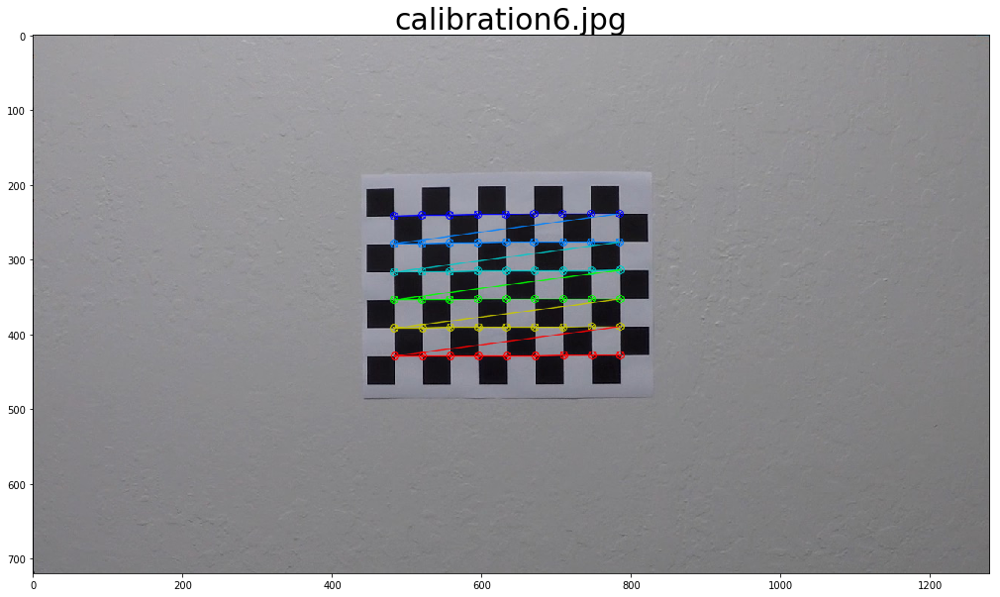

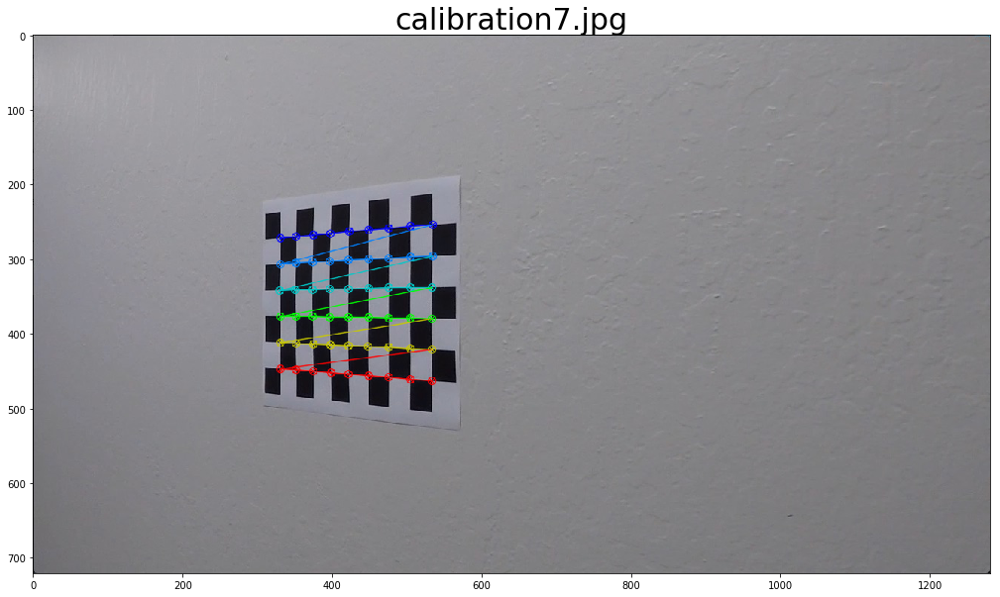

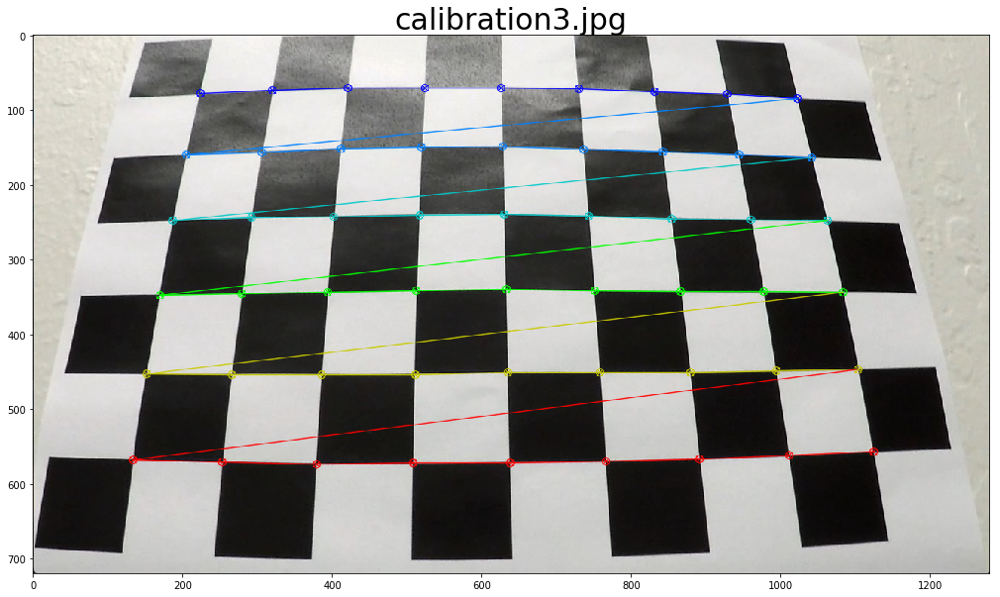

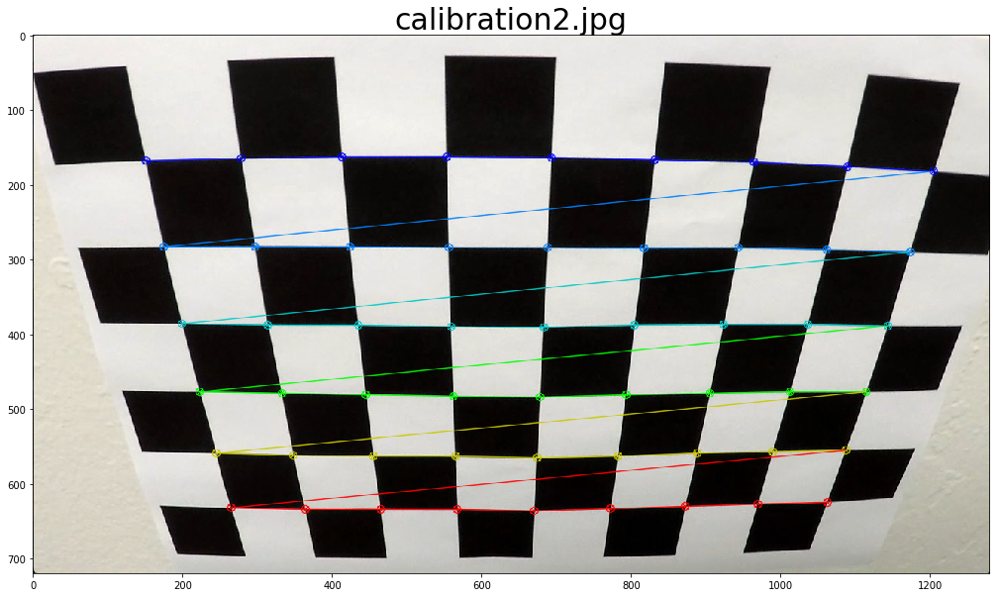

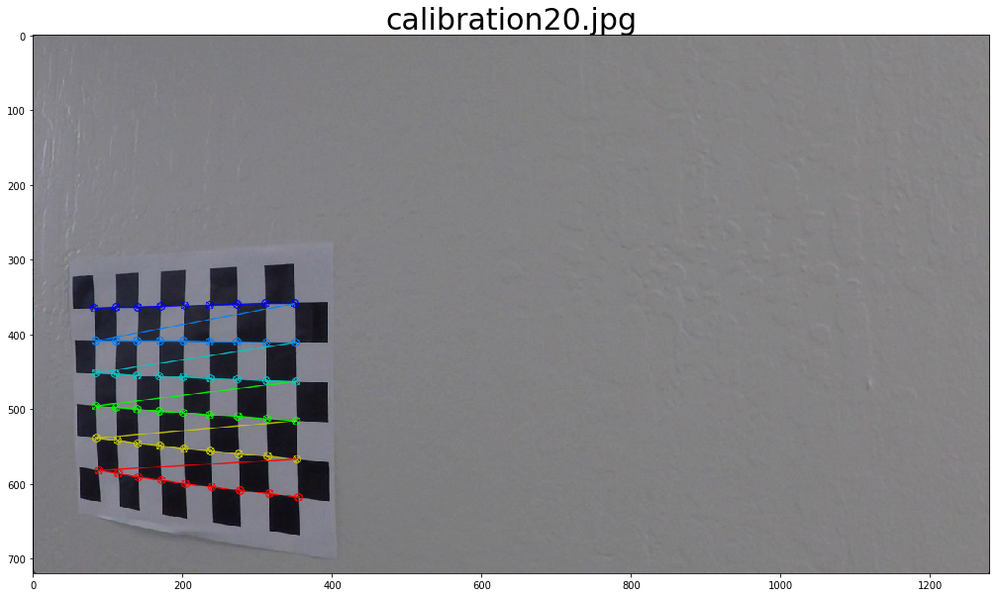

...

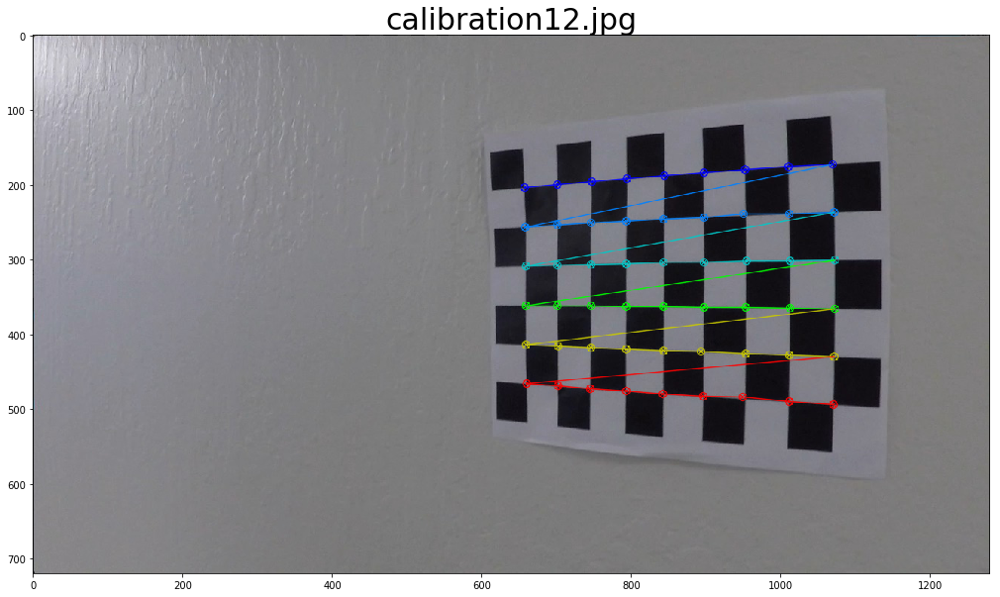

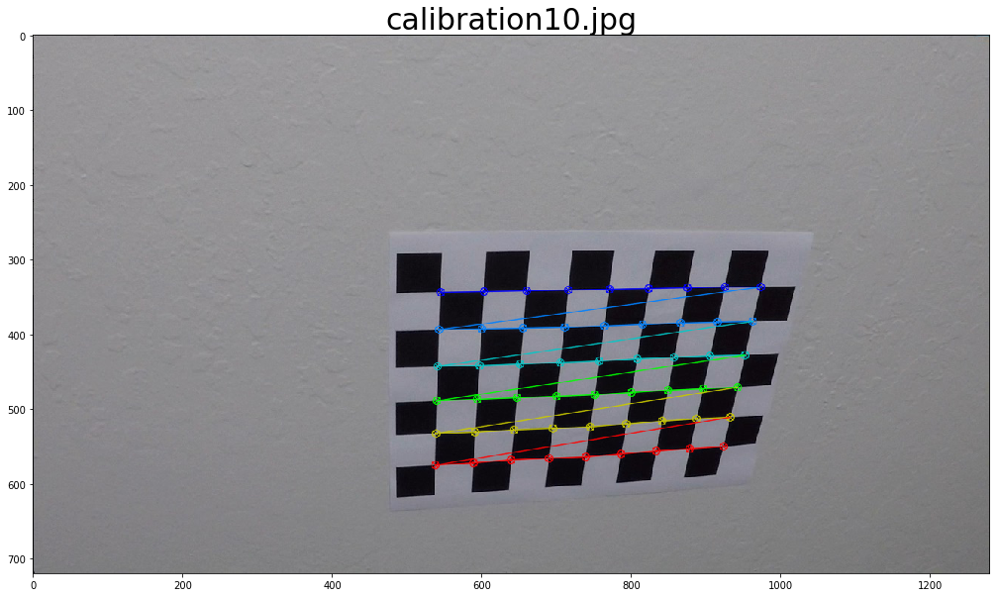

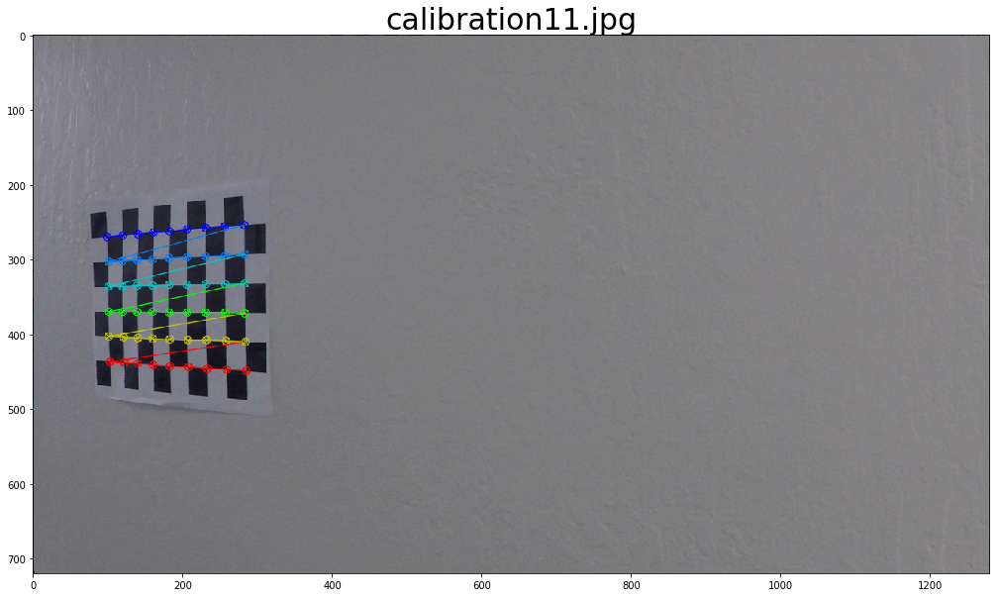

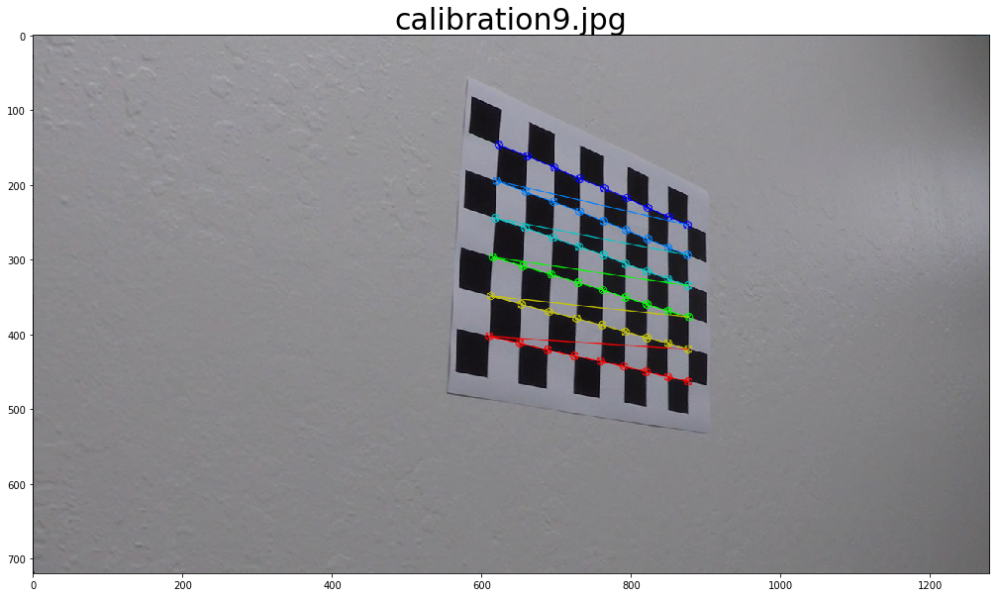

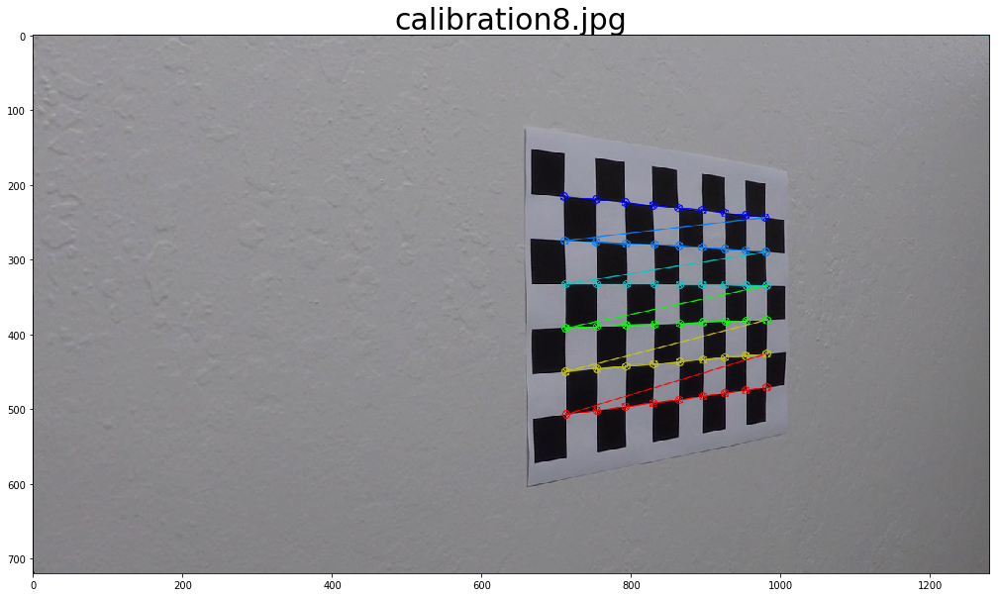

In [2]:
def calibrateCamera(images, verbose=True):
    # Array to store object and image points from all the images
    objpoints = []
    imgpoints = []
    m = 9
    n = 6
    objp = np.zeros((m * n, 3), np.float32)
    objp[:, :2] = np.mgrid[0:m, 0:n].T.reshape(-1, 2)

    for i, fname in enumerate(images):
        img = mpimg.imread(fname)
        # Convert image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the corners of chess board
        ret, corners = cv2.findChessboardCorners(gray, (m, n), None)

        # if corners are found, add points to object and img points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
            img = cv2.drawChessboardCorners(img, (m, n), corners, ret)
            if verbose:
                f, ax1 = plt.subplots(1, 1, figsize=(20, 10))
                f.subplots_adjust(hspace=.2, wspace=.05)
                ax1.imshow(img)
                ax1.set_title(fname[11:], fontsize=30)
#                 plt.show()

    # Do camera calibration given object points and image points
    img = cv2.imread('camera_cal/calibration1.jpg')
    img_size = (img.shape[1], img.shape[0])

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump(dist_pickle, open("calibration.p", "wb"))
    return mtx, dist

images = glob.glob("camera_cal/calibration*.jpg")
mtx, dist = calibrateCamera(images, verbose=True)

# Distortion Correction

- Apply a distortion correction to raw images.

- Before applying the undistort function on the image, we refine the camera matrix based on a free scaling parameter using cv2.getOptimalNewCameraMatrix(). If the scaling parameter alpha=0, it returns undistorted image with minimum unwanted pixels. So it may even remove some pixels at image corners. If alpha=1, all pixels are retained with some extra black images. It also returns an image ROI which can be used to crop the result.

- Notice that without the use of getOptimalNewCameraMatrix function to obtain the camera matrix of the distorted image, a large number of image pixels were being cropped out. This ensures we don't lose out any information from the original image.

- The function transforms an image to compensate radial and tangential lens distortion

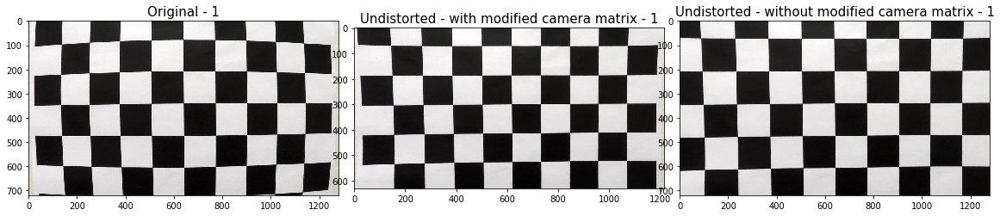

In [3]:
def cal_undistort(img, mtx, dist, fname=None, nameRemove = 0, verbose=False, compareUndist=True):
    h,  w = img.shape[:2]
    newcameramtx, roi = cv2.getOptimalNewCameraMatrix(cameraMatrix = mtx, 
                                                      distCoeffs = dist,imageSize = (w,h),
                                                      alpha = 1, newImgSize =(w,h))
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    dst1 = cv2.undistort(img, mtx, dist, None, newcameramtx)
    x,y,w,h = roi
    dst1 = dst1[y:y+h, x:x+w]
    if verbose:
        if compareUndist:
            f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
            ax3.imshow(dst)
            ax3.set_title('Undistorted - without modified camera matrix - '+ fname[nameRemove:-4], fontsize=15)
        else:
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(img)
        ax1.set_title('Original - ' + fname[nameRemove:-4], fontsize=15)
        ax2.imshow(dst1)
        ax2.set_title('Undistorted - with modified camera matrix - '+ fname[nameRemove:-4], fontsize=15)
    return dst1

images = glob.glob("camera_cal/calibration*.jpg")
for fname in images:
    img = mpimg.imread(fname)
    undist = cal_undistort(img, mtx, dist, fname, nameRemove = len("camera_cal/calibration"), 
                           verbose = True if "calibration1.jpg" in fname else False)
    

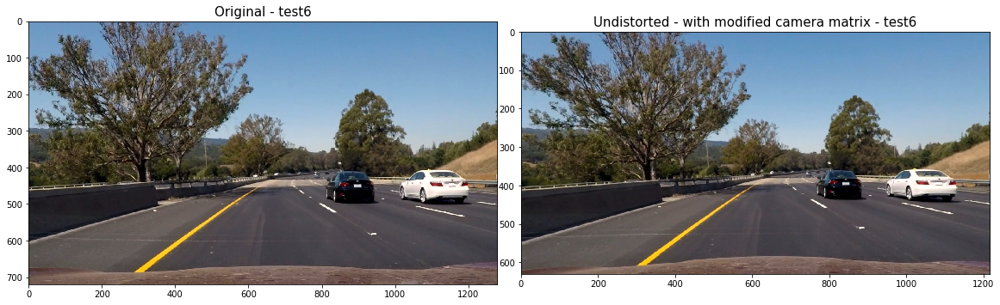

In [102]:
# Test undistortion on an image
test_images = glob.glob("test_images/*")

for fname in test_images:
    img = mpimg.imread(fname)
    n= len("test_images/")
    undist = cal_undistort(img, mtx, dist, fname, nameRemove= n, 
                           verbose= True if "test6.jpg" in fname else False, 
                           compareUndist= False)
    cv2.imwrite("undist_images/" + fname[n:],cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))

# Thresholded binary image

Use color transforms, gradients, etc., to create a thresholded binary image

In [107]:
def hls_s_layer(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    return hls

def abs_sobel_thresh(gray, orient='x', thresh_min=0, thresh_max=255):
    sobel = cv2.Sobel(gray, cv2.CV_64F, 1 if orient == 'x' else 0, 0 if orient == 'x' else 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary_output

def mag_thresh(gray, sobel_kernel=3, mag_thresh=(0, 255)):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    return binary_output

def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    abs_sobelx = np.sqrt(sobelx**2)
    abs_sobely = np.sqrt(sobely**2) 
    grad = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(grad)
    binary_output[(grad > thresh[0]) & (grad < thresh[1])] = 1
    return binary_output

def region_of_interest(img, vertices):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def getThresholdImage(image):
    hls = hls_s_layer(image)
    # convert to gray scale
    gray = cv2.cvtColor(hls, cv2.COLOR_RGB2GRAY)
    
    mask1 = cv2.inRange(hls, np.array([0, 200, 0]), np.array([255, 255,255]))

    ## mask of yellow (190, 190, 0) ~ (255, 255, 255)
    mask2 = cv2.inRange(hls, np.array([10,   0, 100]), np.array([40, 255, 255]))

    mask = cv2.bitwise_or(mask1, mask2)
    target = cv2.bitwise_and(hls, hls, mask=mask)
    
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    
    S_thresh = (70, 300)
    S_binary = np.zeros_like(S)
    S_binary[(S > S_thresh[0]) & (S <= S_thresh[1])] = 1
    
    L_thresh = (200, 255)
    L_binary = np.zeros_like(L)
    L_binary[(L > L_thresh[0]) & (L <= L_thresh[1])] = 1
    
    thresh = (100, 255)
    R = image[:,:,0]
    R_binary = np.zeros_like(R)
    R_binary[(R > thresh[0]) & (R <= thresh[1])] = 1

    mag_binary = mag_thresh(R, sobel_kernel=3, mag_thresh=(50, 200))
    dir_binary = dir_threshold(S, sobel_kernel=3, thresh=(0.5, 1.7))
    combined = np.zeros_like(dir_binary)
    gradx = abs_sobel_thresh(R, orient='x', thresh_min=30, thresh_max=200)
    grady = abs_sobel_thresh(S, orient='y', thresh_min=15, thresh_max=200)    

    combined[((gradx == 1) | (mag_binary == 1) & (R_binary == 1)) | (S_binary == 1) | (L_binary == 1)] = 1
    
    h, w = combined.shape
    vertices = np.array([[(70, h-70),
                          ((w - 70) / 2, (h + 160) / 2),
                          ((w + 150) / 2, (h + 160) / 2),
                          (w - 50, h-70)]],
                        dtype=np.int32)

    v = vertices[0]
    x = [v[0][0], v[1][0], v[2][0], v[3][0]]
    y = [v[0][1], v[1][1], v[2][1], v[3][1]]
    
    masked_image = region_of_interest(combined, vertices)
    
#     f, (ax11, ax12, ax13) = plt.subplots(1, 3, figsize=(24, 9))
#     f.tight_layout()
#     ax11.imshow(image)
#     ax11.set_title('Original - ' + fname[nameRemove:-4], fontsize=15)    
    
#     ax12.imshow(S_binary, cmap='gray')
#     ax12.set_title('S_binary', fontsize=15) 
    
#     ax13.imshow(S, cmap='gray')
#     ax13.set_title('S', fontsize=15)  
    
#     f, (ax21, ax22, ax23) = plt.subplots(1, 3, figsize=(24, 9))
#     ax21.imshow(mag_binary, cmap='gray')
#     ax21.set_title('Mag', fontsize=15)
    
#     inv_dir = np.ones_like(dir_binary)
#     inv_dir = np.subtract(inv_dir, dir_binary)
#     ax22.imshow(inv_dir, cmap='gray')
#     ax22.set_title('Dir', fontsize=15)
    
#     ax23.imshow(gradx, cmap='gray')
#     ax23.set_title('gradx', fontsize=15)
    
#     f, (ax31, ax32, ax33) = plt.subplots(1, 3, figsize=(24, 9))
#     ax33.imshow(grady, cmap='gray')
#     ax33.set_title('grady', fontsize=15)
    
#     ax31.imshow(R_binary, cmap='gray')
#     ax31.set_title('R_binary', fontsize=15) 
    
#     ax32.imshow(R, cmap='gray')
#     ax32.set_title('R', fontsize=15) 
    
#     f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#     ax1.imshow(masked_image, cmap='gray')
#     n= len("undist_images/") 
#     ax1.set_title('Final - '+ fname[n :], fontsize=15) 
#     ax2.imshow(L)
#     ax2.set_title('Original', fontsize=15)
#     ax3.imshow(target, cmap='gray')


    return masked_image

# nameRemove= len("undist_images/") 
# test_images = glob.glob("undist_images/*")
# for fname in test_images:
#     image = mpimg.imread(fname)
#     thresholded = getThresholdImage(image)
    
image = mpimg.imread("undist_images/project-test5.jpg")
thresholded = getThresholdImage(image)

# Helper functions from Project 1
Since we obtained very good results in lane dection using hough lanes in project 1, we will use this principle in mapping a trapezoid that can be used to warp the image for perspective transform. For this purpose we re-included some of the functions used in project 1 here


In [108]:
import math

def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def getIntercepts(lines, min_y, max_y, color=[255, 0, 0], thickness=10):
    l = []
    if lines is not None:
        slope_left, intercept_left, slope_right, intercept_right = avgLines(lines=lines)

        if slope_left != 0:
            x11 = int((min_y - intercept_left)/slope_left)
            x12 = int((max_y - intercept_left) / slope_left)
            l += [(x11, min_y, x12, max_y)]
            
        if slope_right != 0:
            x21 = int((min_y - intercept_right) / slope_right)
            x22 = int((max_y - intercept_right) / slope_right)
            l += [(x21, min_y, x22, max_y)]
    return l


def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap, min_y, max_y):
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    l = getIntercepts(lines, min_y=min_y, max_y=max_y)
    return l

def avgLines(lines):
    left_slope = 0
    left_weights = 0
    left_intercept = 0
    right_slope = 0
    right_weights = 0
    right_intercept = 0
    for line in lines:
        for x1, y1, x2, y2 in line:
            if x2 == x1 and abs(slope) < 0.05:
                continue  # ignore a vertical line
            slope = (y2 - y1)*1.0 / (x2 - x1)
            intercept = y1 - slope * x1
            weight = np.sqrt((y2-y1)**2+(x2-x1)**2)
            if slope < 0:
                left_slope += slope*weight
                left_intercept += intercept*weight
                left_weights += weight
            else:
                right_slope += slope * weight
                right_intercept += intercept * weight
                right_weights += weight
                
    if left_weights != 0:
        left_slope = left_slope/left_weights
        left_intercept = left_intercept/left_weights
    if right_weights != 0:
        right_intercept = right_intercept/right_weights
        right_slope = right_slope/right_weights

    return left_slope, left_intercept, right_slope, right_intercept

def selectLaneColor(img):
    #     hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    ## mask of white (200, 200, 200) ~ (255, 255,255)
    mask1 = cv2.inRange(img, np.array([0, 200, 0]), np.array([255, 255,255]))

    ## mask of yellow (190, 190, 0) ~ (255, 255, 255)
    mask2 = cv2.inRange(img, np.array([10,   0, 100]), np.array([40, 255, 255]))

    ## final mask and masked
    mask = cv2.bitwise_or(mask1, mask2)
    target = cv2.bitwise_and(img, img, mask=mask)
    # plt.imshow(target)
    return target

def detectLanes(img):

    img.astype('uint8')
    conv_img1 = cv2.cvtColor(img, cv2.COLOR_RGB2HLS_FULL)
    masked_img = selectLaneColor(conv_img1)
    conv_img2 = cv2.cvtColor(masked_img, cv2.COLOR_HLS2RGB)
    conv_img3 = cv2.cvtColor(conv_img2, cv2.COLOR_RGB2GRAY)
    kernel_size = 7  # Must be an odd number (3, 5, 7...)
    blur_gray = gaussian_blur(conv_img3, kernel_size)
    canny_img = canny(blur_gray, 50, 150)

    imshape = img.shape
    vertices = np.array([[(50, imshape[0]),
                          ((imshape[1] - 100) / 2, (imshape[0] + 100) / 2),
                          ((imshape[1] + 100) / 2, (imshape[0] + 100) / 2),
                          (imshape[1] - 50, imshape[0])]],
                        dtype=np.int32)
    v = vertices[0]
    x = [v[0][0], v[1][0], v[2][0], v[3][0]]
    y = [v[0][1], v[1][1], v[2][1], v[3][1]]
    masked_edges = region_of_interest(canny_img, vertices=vertices)

    rho = 1
    theta = np.pi / 180
    threshold = 30
    min_line_length = 10
    max_line_gap = 10
    lines = hough_lines(img=masked_edges, rho=rho, theta=theta, threshold=threshold, min_line_len=min_line_length,
                             max_line_gap=max_line_gap, min_y=int((imshape[0] + 200) / 2), max_y=imshape[0])

    return lines

# Perspective Transform
Apply a perspective transform to rectify binary image ("birds-eye view").


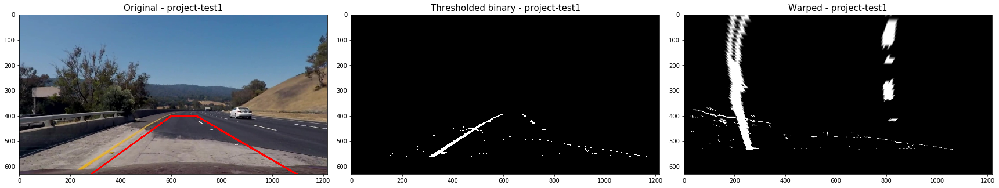

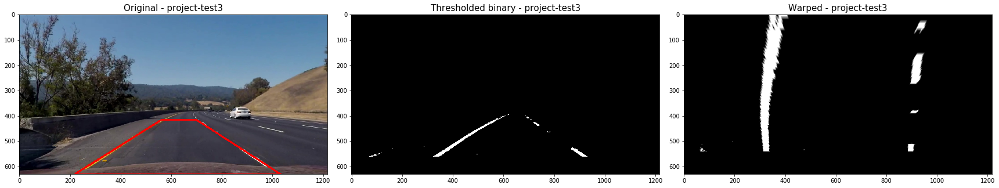

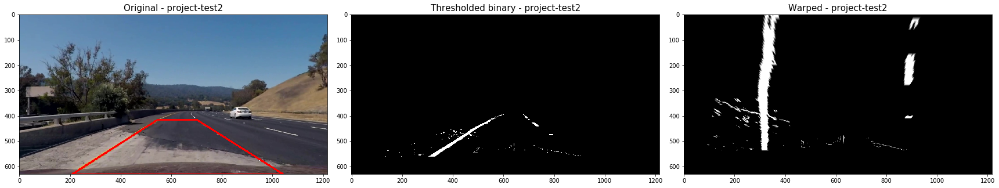

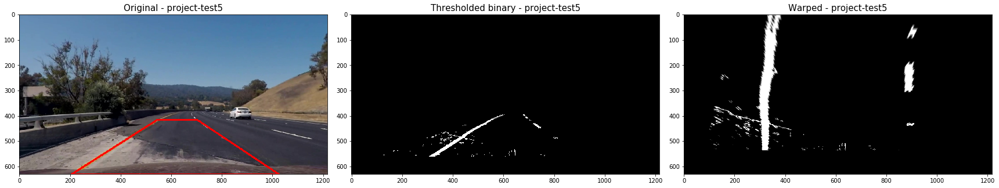

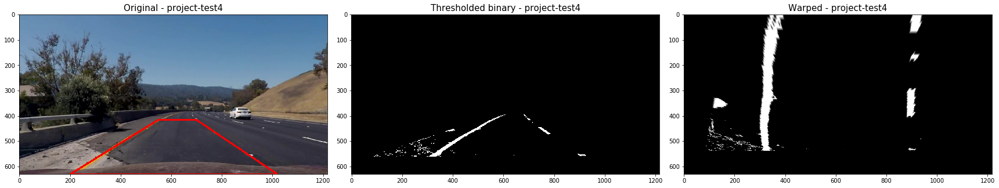

...

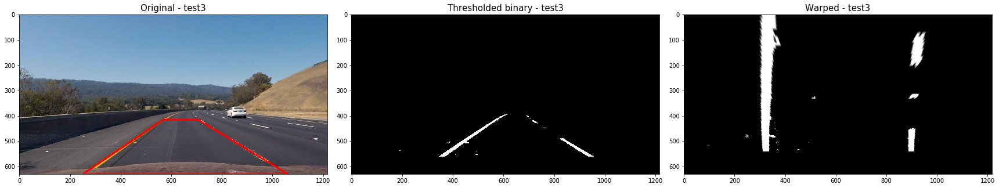

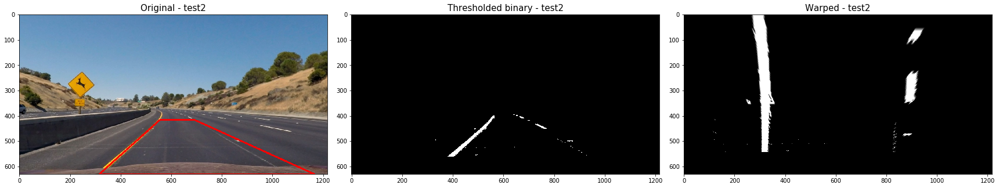

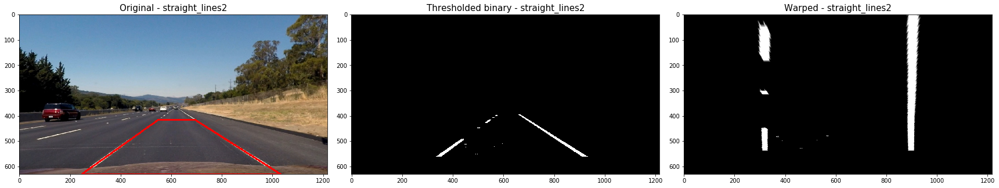

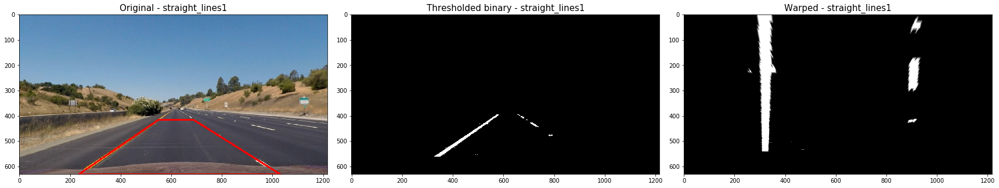

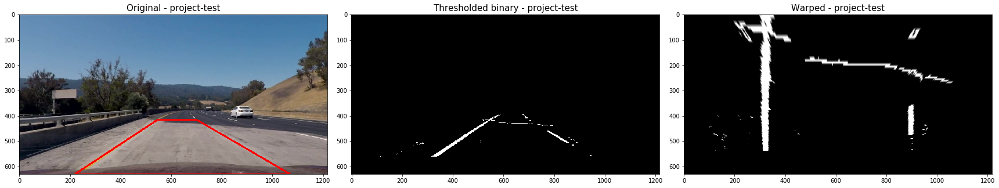

In [109]:
import matplotlib.cm as cm
def perspectiveTransform(img, thresholded):
    # Vertices extracted manually for performing a perspective transform
    
    lines = detectLanes(img)
    if len(lines) >1:
        left_line = lines[0]
        right_line = lines[1]
        
        bottom_left = left_line[2:]
        bottom_right = right_line[2:]
        top_left = left_line[:2]
        top_right = right_line[:2]
    else:
        bottom_left = [160,720]
        bottom_right = [1250, 720]
        top_left = [600, 400]
        top_right = [700, 400]
    h, w, b = img.shape
    source = np.float32([bottom_left,bottom_right,top_right,top_left])
    pts = np.array([bottom_left,bottom_right,top_right,top_left], np.int32)
    pts = pts.reshape((-1,1,2))
    copy = img.copy()
    cv2.polylines(copy,[pts],True,(255,0,0), thickness=5)

    dst = np.float32([(450,0),
                  (w-450,0),
                  (450,h),
                  (w-450,h)])
    
#     bottom_left = [320,720]
#     bottom_right = [920, 720]
#     top_left = [320, 1]
#     top_right = [920, 1]
    
    bottom_left = [320, h-50]
    bottom_right = [w-320, h-50]
    top_left = [320, 50]
    top_right = [w-320, 50]

    dst = np.float32([bottom_left,bottom_right,top_right,top_left])
    M = cv2.getPerspectiveTransform(source, dst)
    M_inv = cv2.getPerspectiveTransform(dst, source)
    image_shape = img.shape
    img_size = (image_shape[1], image_shape[0])

    warped = cv2.warpPerspective(thresholded, M, img_size , flags=cv2.INTER_LINEAR)
    
    unwarped = cv2.warpPerspective(warped, M_inv, img_size , flags=cv2.INTER_LINEAR)
    
    return copy, warped, unwarped, M, M_inv

nameRemove= len("undist_images/") 
test_images = glob.glob("undist_images/*")
for fname in test_images:
    image = mpimg.imread(fname)
    
    thresholded = getThresholdImage(image)
    img, warped, unwarped, M, M_inv = perspectiveTransform(image, thresholded)
    
    warped.astype('uint8')
    plt.imsave("warped_images/" + fname[nameRemove:], warped, cmap=cm.gray)
#     cv2.imwrite("warped_images/" + fname[nameRemove:], warped*255)
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original - ' + fname[nameRemove:-4], fontsize=15)    
    ax2.imshow(thresholded, cmap='gray')
    ax2.set_title('Thresholded binary - ' + fname[nameRemove:-4], fontsize=15)
    ax3.imshow(warped, cmap='gray')
    ax3.set_title('Warped - ' + fname[nameRemove:-4], fontsize=15)

# Find lane boundary
Detect lane pixels and fit to find the lane boundary.

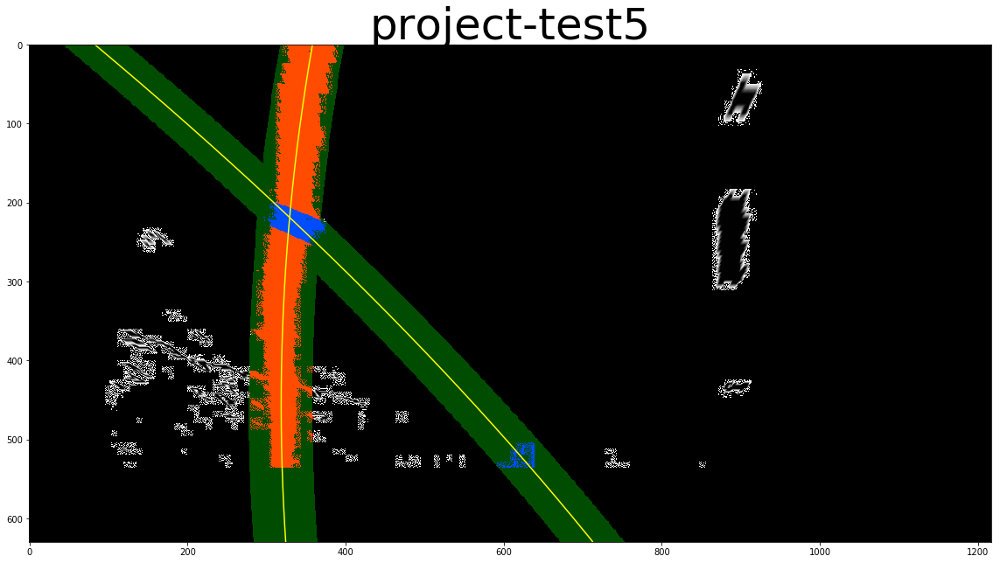

In [117]:
def plotHistogram(binary_warped):
    histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:, :], axis=0)
    midpoint = np.int(histogram.shape[0] // 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    return histogram, leftx_base, rightx_base


def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:, :], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] // 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 10
    # Set the width of the windows +/- margin
    margin = 40
    # Set minimum number of pixels found to recenter window
    minpix = 100

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0] // nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low),
                      (win_xleft_high, win_y_high), (0, 255, 0), 2)
        cv2.rectangle(out_img, (win_xright_low, win_y_low),
                      (win_xright_high, win_y_high), (0, 255, 0), 2)

        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_poly(binary_warped, leftx=None, lefty=None, rightx=None, righty=None):
    #     print(leftx, lefty, rightx, righty)
    img_shape = binary_warped.shape
    if leftx is None or lefty is None or rightx is None or righty is None:
        leftx, lefty, rightx, righty, _ = find_lane_pixels(binary_warped)
        ### Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])

    ### Calc both polynomials using ploty, left_fit and right_fit ###
    try:
        left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
        right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1 * ploty ** 2 + 1 * ploty
        right_fitx = 1 * ploty ** 2 + 1 * ploty

    return left_fit, right_fit, left_fitx, right_fitx, ploty


def search_around_poly(binary_warped, left_fit=None, right_fit=None):
    # HYPERPARAMETER
    margin = 40

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    if left_fit is None and right_fit is None:
        fit = fit_poly(binary_warped, None, None, None, None)
        left_fit = fit[0]
        right_fit = fit[1]

    ### Set the area of search based on activated x-values within the +/- margin of our polynomial function ###
    left_currentx = (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2])
    left_lane_inds = ((nonzerox > (left_currentx - margin)) & (nonzerox < (left_currentx + margin)))

    right_currentx = (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2])
    right_lane_inds = ((nonzerox > (right_currentx - margin)) & (nonzerox < (right_currentx + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fit, right_fit, left_fitx, right_fitx, ploty = fit_poly(binary_warped, leftx, lefty, rightx, righty)

    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin,
                                                                    ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin,
                                                                     ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    return result, left_fit, right_fit, left_fitx, right_fitx

nameRemove= len("warped_images/") 
# test_images = glob.glob("warped_images/*")
left_fit = None
right_fit = None
fname = "warped_images/project-test5.jpg"
image = mpimg.imread(fname)
binary_warped = image[:, :, 0]
img_shape = binary_warped.shape
result, left_fit, right_fit, left_fitx, right_fitx = search_around_poly(binary_warped, left_fit, right_fit)

f, ax1 = plt.subplots(1, 1, figsize=(16, 9))
f.tight_layout()
ax1.imshow(result)
ax1.set_title(fname[nameRemove:-4], fontsize=50)
#     ax2.imshow(mapped)
ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
# for fname in test_images:
   

# Lane Curvature

In [111]:
def measure_curvature_real(ploty, leftx, rightx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30 / 720  # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700  # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, rightx * xm_per_pix, 2)

    # Define y-value where we want radius of curvature
    y_eval = np.max(ploty)

    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * right_fit_cr[0])

    return left_curverad, right_curverad


def distance_from_center(img_shape, left_fitx, right_fitx):
    # compute the offset from the center
    lane_center = (right_fitx[0] + left_fitx[0]) / 2
    xm_per_pix = 3.7 / 700  # meters per pixel in x dimension
    center_offset_pixels = abs(img_shape[0] / 2 - lane_center)
    center_offset_mtrs = xm_per_pix * center_offset_pixels
    offset_string = "Center offset: %.2f m" % center_offset_mtrs
    return center_offset_mtrs

In [112]:
def warp_lane(warped, img, ploty, left_fitx, right_fitx, M_inv):
    img_shape = img.shape
    img_size = (img_shape[1], img_shape[0])
    out_img = np.dstack((warped, warped, warped)) * 255

    left_line_window = np.array(np.transpose(np.vstack([left_fitx, ploty])))

    right_line_window = np.array(np.flipud(np.transpose(np.vstack([right_fitx, ploty]))))

    line_points = np.vstack((left_line_window, right_line_window))

    cv2.fillPoly(out_img, np.int_([line_points]), [0, 255, 0])

    unwarped = cv2.warpPerspective(out_img, M_inv, img_size, flags=cv2.INTER_LINEAR)
    unwarped = unwarped.astype('uint8')
    result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)

    return result

# nameRemove= len("warped_images/") 
# test_images = glob.glob("warped_images/*")
# left_fit = None
# right_fit = None
# for fname in test_images:
#     image = mpimg.imread(fname)
#     binary_warped = image[:, :, 0]
#     img_shape = binary_warped.shape
#     result, left_fit, right_fit, left_fitx, right_fitx = search_around_poly(binary_warped, left_fit, right_fit)
#     ploty = np.linspace(0, img_shape[0]-1, img_shape[0] )
#     left_curverad, right_curverad = measure_curvature_real(ploty, left_fitx, right_fitx)
#     center_distance = distance_from_center(img_shape, left_fitx, right_fitx)
#     average_curve_rad = (left_curverad + right_curverad)/2
    
# #     mapped = warp_lane(fname[nameRemove:], ploty, left_fitx, right_fitx, M_inv, img_shape)
    
#     print(fname[nameRemove:-4], "Curvature", average_curve_rad, 'm', "Offset", center_distance, "m")
#     f, ax1 = plt.subplots(1, 1, figsize=(16, 9))
#     f.tight_layout()
#     ax1.imshow(result)
#     ax1.set_title(fname[nameRemove:-4], fontsize=50)
# #     ax2.imshow(mapped)
    
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
    

Warp the detected lane boundaries back onto the original image.

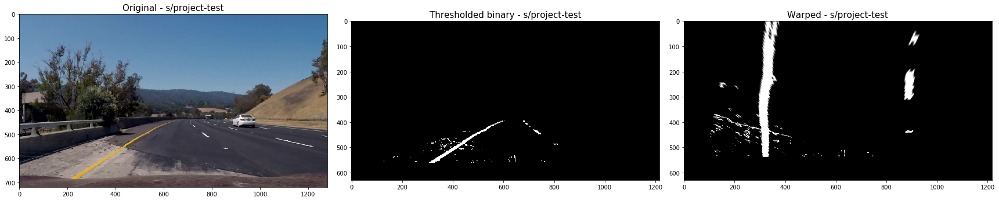

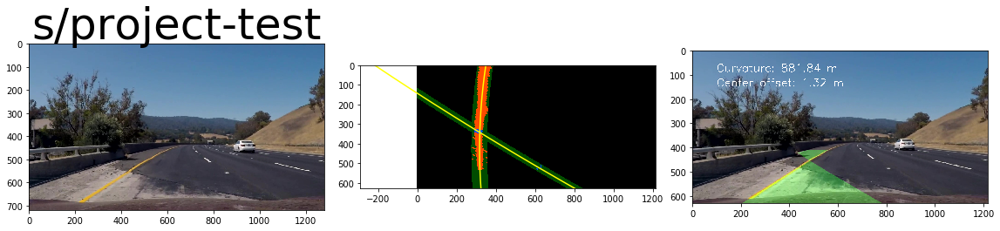

In [114]:
def plotPerspectiveTransform(fname, img, thresholded, warped):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original - ' + fname, fontsize=15)
    ax2.imshow(thresholded, cmap='gray')
    ax2.set_title('Thresholded binary - ' + fname, fontsize=15)
    ax3.imshow(warped, cmap='gray')
    ax3.set_title('Warped - ' + fname, fontsize=15)


def plotFinal(original, result, mapped, left_fitx, right_fitx, ploty, fname):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 9))
    f.tight_layout()
    result = result.astype(int)
    ax1.imshow(original)
    ax1.set_title(fname, fontsize=50)
    ax2.imshow(result)
    ax2.plot(left_fitx, ploty, color='yellow')
    ax2.plot(right_fitx, ploty, color='yellow')
    ax3.imshow(mapped)

def final_pipeline(img=None, fname=None, nameRemove=0, verbose=False, left_fit=None, right_fit=None):
    if img is None:
        img = mpimg.imread(fname)
        
    undist = cal_undistort(img, mtx, dist, fname, nameRemove=nameRemove, verbose=False, compareUndist=False)
    # cv2.imwrite("undist_images/" + fname[n:],cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    thresholded = getThresholdImage(undist)
#     plt.imshow(thresholded)
    
    image, warped, unwarped, M, M_inv = perspectiveTransform(undist, thresholded)
    warped.astype('uint8')
    
    if verbose:
#         plt.imshow(warped)
        plotPerspectiveTransform(fname[nameRemove:-4], img, thresholded, warped)

    result, left_fit, right_fit, left_fitx, right_fitx = search_around_poly(warped, left_fit, right_fit)

    warped = warped * 255
    img_shape = warped.shape
    ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])
    left_curverad, right_curverad = measure_curvature_real(ploty, left_fitx, right_fitx)
    offset = distance_from_center(img_shape, left_fitx, right_fitx)
    average_curve_rad = (left_curverad + right_curverad) / 2

    mapped = warp_lane(warped, undist, ploty, left_fitx, right_fitx, M_inv)
    
    curv_str = "Curvature: %.2f m" % average_curve_rad  
    offset_str = "Center offset: %.2f m" % offset
    
    cv2.putText(mapped, curv_str , (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    cv2.putText(mapped, offset_str, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)

    if verbose:
#         print(fname[nameRemove:-4], "Curvature", average_curve_rad, 'm', "Offset", offset, "m")
        plotFinal(img, result, mapped, left_fitx, right_fitx, ploty, fname[nameRemove:-4])
    
    return mapped

test_images = glob.glob("test_images/*")

img = mpimg.imread("test_images/project-test5.jpg")
n = len("test_images/")
mapped = final_pipeline(img, fname, nameRemove=n, verbose=True)
# cv2.imwrite("final_images/" + fname[n:], cv2.cvtColor(mapped, cv2.COLOR_BGR2RGB))

# for fname in test_images:
#     img = mpimg.imread(fname)
#     n = len("test_images/")
#     mapped = final_pipeline(img, fname, nameRemove=n, verbose=True)
#     cv2.imwrite("final_images/" + fname[n:], cv2.cvtColor(mapped, cv2.COLOR_BGR2RGB))
    

Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


100%|█████████▉| 1260/1261 [05:50<00:00,  3.57it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

CPU times: user 10min 17s, sys: 1min 28s, total: 11min 46s
Wall time: 5min 52s


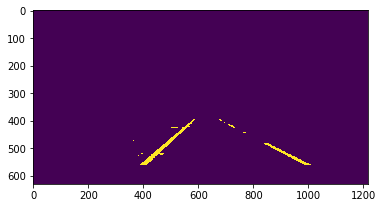

In [95]:
from moviepy.editor import VideoFileClip

output = 'test_videos_output/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
clip = clip1.fl_image(final_pipeline) #NOTE: this function expects color images!!
%time clip.write_videofile(output, audio=False)

In [96]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

[MoviePy] >>>> Building video test_videos_output/challenge_video.mp4
[MoviePy] Writing video test_videos_output/challenge_video.mp4


 30%|███       | 147/485 [00:38<01:34,  3.58it/s]

TypeError: expected non-empty vector for x

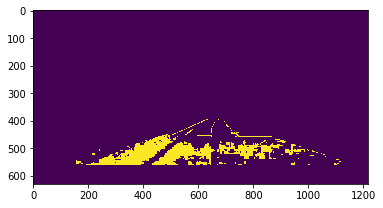

In [99]:
output = 'test_videos_output/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("challenge_video.mp4")
clip = clip1.fl_image(final_pipeline) #NOTE: this function expects color images!!
%time clip.write_videofile(output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

[MoviePy] >>>> Building video test_videos_output/harder_challenge_video.mp4
[MoviePy] Writing video test_videos_output/harder_challenge_video.mp4



  7%|▋         | 79/1200 [00:26<07:39,  2.44it/s]

ValueError: cannot convert float NaN to integer

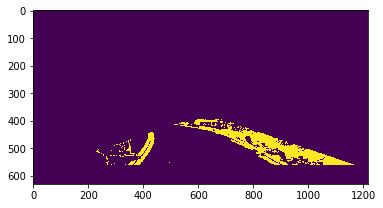

In [100]:
output = 'test_videos_output/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("harder_challenge_video.mp4")
clip = clip1.fl_image(final_pipeline) #NOTE: this function expects color images!!
%time clip.write_videofile(output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))